In [1]:
api_key="RGAPI-91f31898-1c3f-4735-9040-177e092cdb8c"
api_url = "https://eun1.api.riotgames.com/lol/summoner/v4/summoners/by-name/Ridek240"
import requests
import pandas as pd


In [2]:
api_url = "https://eun1.api.riotgames.com/lol/summoner/v4/summoners/by-name/Krzysztof%20Gołomp"
api_url = api_url + '?api_key=' + api_key
api_url
resp = requests.get(api_url)
player_info = resp.json()
puuid = player_info['puuid']

In [3]:
puuid

'79UnBjvh9UP8_SYWVyDo9dvipSHJACsaZ_UTbRkkYEE3aVdDrfJK5qe1V5LW2niBxIzLOtA1lKxnKQ'

In [4]:
api_url2 = f"https://europe.api.riotgames.com/lol/match/v5/matches/by-puuid/{puuid}/ids?start=0&count=20"
api_url2 = api_url2 + '&api_key=' + api_key 
resp = requests.get(api_url2)
match_ids = resp.json()

match_ids

['EUN1_3563516741',
 'EUN1_3563494075',
 'EUN1_3563465618',
 'EUN1_3562780127',
 'EUN1_3561545535',
 'EUN1_3561525607',
 'EUN1_3561514787',
 'EUN1_3561503151',
 'EUN1_3561485084',
 'EUN1_3561459416',
 'EUN1_3560898514',
 'EUN1_3560878852',
 'EUN1_3552647690',
 'EUN1_3552630664',
 'EUN1_3520581437',
 'EUN1_3494660188',
 'EUN1_3492669098',
 'EUN1_3491283984',
 'EUN1_3490703573',
 'EUN1_3489838595']

In [5]:
listofmatches = []

In [6]:
listofmatches = []
for matchid in match_ids:
        api_url = "https://europe.api.riotgames.com/lol/match/v5/matches/" + matchid
        # This one doesn't have any arguments (see, there's no "?" above) so we'll add it with the api key
        api_url = api_url + '?api_key=' + api_key
        resp = requests.get(api_url)
        listofmatches.append(resp)

In [10]:
listofmatches[0].json()['info']['teams'][0]

KeyError: 'info'

In [7]:
listofmatches

[<Response [200]>,
 <Response [200]>,
 <Response [200]>,
 <Response [200]>,
 <Response [200]>,
 <Response [200]>,
 <Response [200]>,
 <Response [200]>,
 <Response [200]>,
 <Response [200]>,
 <Response [200]>,
 <Response [200]>,
 <Response [200]>,
 <Response [200]>,
 <Response [200]>,
 <Response [200]>,
 <Response [200]>,
 <Response [200]>,
 <Response [200]>,
 <Response [200]>]

In [8]:
allmatches_df = pd.DataFrame()
allbans_df = pd.DataFrame()
allplayers_df = pd.DataFrame()

In [9]:
import pandas as pd

# Initialize empty DataFrames
allmatches_df = pd.DataFrame()
allplayers_df = pd.DataFrame()
allbans_df = pd.DataFrame()

# Iterate over listofmatches
for match_data in listofmatches:
    # Extract main game data
    main_data = {k: v for k, v in match_data.json()['info'].items() if k not in ['participants', 'teams']}
    
    # Convert main_data to DataFrame
    matches_df = pd.DataFrame([main_data])
    
    # Extract participants and teams data
    participants_df = pd.DataFrame(match_data.json()['info']['participants'])
    teams_df = pd.DataFrame(match_data.json()['info']['teams'])
    
    # Add gameId to participants and teams DataFrames
    participants_df['gameId'] = match_data.json()['info']['gameId']
    teams_df['gameId'] = match_data.json()['info']['gameId']
    
    # Concatenate or append DataFrames
    allmatches_df = pd.concat([allmatches_df, matches_df], ignore_index=True)
    allplayers_df = pd.concat([allplayers_df, participants_df], ignore_index=True)
    allbans_df = pd.concat([allbans_df, teams_df], ignore_index=True)

In [8]:
# Katalog zawierający pliki CSV
katalog = './LoL_Icons/memory'

# Słowo kluczowe
slowo_kluczowe = 'allmatches'

# Lista przechowująca wczytane DataFrame'y
dfs = []

# Iteracja po plikach w katalogu
for plik in os.listdir(katalog):
    if plik.endswith('.csv') and slowo_kluczowe in plik:
        # Wczytaj plik CSV do DataFrame'a i dodaj go do listy
        df = pd.read_csv(os.path.join(katalog, plik))
        dfs.append(df)

# Połącz wszystkie DataFrame'y w jeden
allmatches_df = pd.concat(dfs, ignore_index=True)

In [9]:
allmatches_df

,Unnamed: 0,endOfGameResult,gameCreation,gameDuration,gameEndTimestamp,gameId,gameMode,gameName,gameStartTimestamp,gameType,gameVersion,mapId,platformId,queueId,tournamentCode
0,0,GameComplete,1713900167052,1470,1713901761415,3586611157,CLASSIC,51e60ad9-0afe-4120-b2de-ef689ca9c8f4,1713900291364,CUSTOM_GAME,14.8.576.8838,11,EUN1,0,EUNE04d7c-de28c907-6a44-448a-ade9-ac56bcd83343
1,0,GameComplete,1713896788863,1397,1713898227951,3586556986,CLASSIC,4bc51c03-d53c-478e-b62c-c14972c8113d,1713896830230,CUSTOM_GAME,14.8.576.8838,11,EUN1,0,EUNE04d7c-dec67aa6-b6b8-410a-b9be-8acfc6987fc0
2,0,GameComplete,1713810693938,1125,1713811862112,3586104088,CLASSIC,9e8d0585-2c9b-4c6e-b32b-3c931696f84d,1713810736547,CUSTOM_GAME,14.8.576.8838,11,EUN1,0,EUNE04d7b-f405d089-8922-4023-8a68-b4c4cdcf8687
3,0,GameComplete,1713882453537,1648,1713884152743,3586443307,CLASSIC,6ad7bcee-dbbe-4e0b-9aff-5d5a39bcb479,1713882503968,CUSTOM_GAME,14.8.576.8838,11,EUN1,0,EUNE04d7c-f3661d6b-26a1-4547-a67a-619296256599
4,0,GameComplete,1713795870000,2078,1713797997507,3585968081,CLASSIC,bc2c223a-00e0-49cf-85d6-a9e326d4c758,1713795918874,CUSTOM_GAME,14.8.576.8838,11,EUN1,0,EUNE04d7b-be7a8e03-a321-4b5a-878b-a0b91316a9dc
5,0,GameComplete,1713803626758,1774,1713805449999,3586024340,CLASSIC,7a1f525e-f856-4a5f-99cb-39eeb79f69bf,1713803675376,CUSTOM_GAME,14.8.576.8838,11,EUN1,0,EUNE04d7b-1ec0597c-72c5-499b-aa3a-ad5458c54a54
6,0,GameComplete,1713885654104,2512,1713888177273,3586464496,CLASSIC,c462fede-e755-45fd-910b-1c2372a2e61d,1713885664874,CUSTOM_GAME,14.8.576.8838,11,EUN1,0,EUNE04d7c-2856aacd-0036-41f6-8535-287983381a2a
7,0,GameComplete,1713889684420,1391,1713891123859,3586495493,CLASSIC,23ac1a65-7630-4ab5-bcb0-0b3d7a6c83e6,1713889732070,CUSTOM_GAME,14.8.576.8838,11,EUN1,0,EUNE04d7c-764898fa-4229-4c23-a2f1-342b5a3b751d
8,0,GameComplete,1713807076646,1083,1713808181252,3586057343,CLASSIC,8f3c0823-9a4e-4690-b640-9da441887928,1713807097828,CUSTOM_GAME,14.8.576.8838,11,EUN1,0,EUNE04d7b-8a5830bc-c731-4ad9-a09a-ec723ea14626
9,0,GameComplete,1713814016737,1358,1713815386140,3586131278,CLASSIC,62406596-4746-4a82-b736-966fd4f033a9,1713814027872,CUSTOM_GAME,14.8.576.8838,11,EUN1,0,EUNE04d7b-d7704808-266f-4b5b-8e47-4519e4a38df3


In [10]:
import os
import pandas as pd

# Katalog zawierający pliki CSV
katalog = './LoL_Icons/memory'

# Słowo kluczowe
slowo_kluczowe = 'allplayers'

# Lista przechowująca wczytane DataFrame'y
dfs = []

# Iteracja po plikach w katalogu
for plik in os.listdir(katalog):
    if plik.endswith('.csv') and slowo_kluczowe in plik:
        # Wczytaj plik CSV do DataFrame'a i dodaj go do listy
        df = pd.read_csv(os.path.join(katalog, plik))
        dfs.append(df)

# Połącz wszystkie DataFrame'y w jeden
allplayers_df = pd.concat(dfs, ignore_index=True)

# Wyświetl pierwsze kilka wierszy złączonego DataFrame'a


In [2]:
allplayers_df.head()

,Unnamed: 0,allInPings,assistMePings,assists,baronKills,basicPings,bountyLevel,challenges,champExperience,champLevel,...,turretTakedowns,turretsLost,unrealKills,visionClearedPings,visionScore,visionWardsBoughtInGame,wardsKilled,wardsPlaced,win,gameId
0,0,0,0,5,0,0,0,"{'12AssistStreakCount': 0, 'abilityUses': 213,...",15102,16,...,6,0,0,0,19,0,1,6,True,3586611157
1,1,0,0,12,0,0,1,"{'12AssistStreakCount': 0, 'abilityUses': 271,...",11233,13,...,5,0,0,0,21,7,2,6,True,3586611157
2,2,0,4,6,0,0,1,"{'12AssistStreakCount': 0, 'abilityUses': 275,...",13368,15,...,3,0,0,0,10,2,1,6,True,3586611157
3,3,0,2,7,1,0,2,"{'12AssistStreakCount': 0, 'abilityUses': 196,...",11838,14,...,7,0,0,0,15,3,1,7,True,3586611157
4,4,0,0,14,0,0,0,"{'12AssistStreakCount': 1, 'abilityUses': 45, ...",8631,12,...,7,0,0,0,54,4,6,20,True,3586611157


In [11]:
value_counts_series = allplayers_df['championName'].value_counts()

print("Unikalne wartości i liczba ich wystąpień:")
print(value_counts_series)

Unikalne wartości i liczba ich wystąpień:
Ornn        5
Volibear    5
Nautilus    5
Ahri        4
Braum       4
           ..
Poppy       1
JarvanIV    1
Jhin        1
Amumu       1
Sivir       1
Name: championName, Length: 68, dtype: int64


In [14]:
value_counts_series = allplayers_df['championName'].value_counts()

# Konwertuj Serię na DataFrame i ustaw indeks jako kolumnę
unique_values_df = value_counts_series.reset_index()
unique_values_df.columns = ['Champion', 'PickRatioCount']

print("DataFrame z unikalnymi wartościami i liczbą ich wystąpień:")
unique_values_df

DataFrame z unikalnymi wartościami i liczbą ich wystąpień:


,Champion,PickRatioCount
0,Ornn,5
1,Volibear,5
2,Nautilus,5
3,Ahri,4
4,Braum,4
...,...,...
63,Poppy,1
64,JarvanIV,1
65,Jhin,1
66,Amumu,1


In [16]:
original_rows_count = len(allmatches_df)

# Załóżmy, że 'unique_values_df' to DataFrame zawierający unikalne wartości i ich liczność
# Dzielimy wartości w kolumnie "Liczba Wystąpień" przez liczbę wierszy w oryginalnym DataFrame
unique_values_df['PickRatioPerc']=  unique_values_df['PickRatioCount']/ original_rows_count

unique_values_df

,Champion,PickRatioCount,PickRatioPerc
0,Ornn,5,0.416667
1,Volibear,5,0.416667
2,Nautilus,5,0.416667
3,Ahri,4,0.333333
4,Braum,4,0.333333
...,...,...,...
63,Poppy,1,0.083333
64,JarvanIV,1,0.083333
65,Jhin,1,0.083333
66,Amumu,1,0.083333


In [23]:
# Katalog zawierający pliki CSV
katalog = './LoL_Icons/memory'

# Słowo kluczowe
slowo_kluczowe = 'allbans'

# Lista przechowująca wczytane DataFrame'y
dfs = []

# Iteracja po plikach w katalogu
for plik in os.listdir(katalog):
    if plik.endswith('.csv') and slowo_kluczowe in plik:
        # Wczytaj plik CSV do DataFrame'a i dodaj go do listy
        df = pd.read_csv(os.path.join(katalog, plik))
        dfs.append(df)

# Połącz wszystkie DataFrame'y w jeden
allbans_df = pd.concat(dfs, ignore_index=True)

In [21]:
allbans_df

,Unnamed: 0,bans,objectives,teamId,win,gameId
0,0,"[{'championId': 3, 'pickTurn': 1}, {'championI...","{'baron': {'first': True, 'kills': 1}, 'champi...",100,True,3586611157
1,1,"[{'championId': 96, 'pickTurn': 2}, {'champion...","{'baron': {'first': False, 'kills': 0}, 'champ...",200,False,3586611157
2,0,"[{'championId': 103, 'pickTurn': 1}, {'champio...","{'baron': {'first': True, 'kills': 1}, 'champi...",100,True,3586556986
3,1,"[{'championId': 96, 'pickTurn': 2}, {'champion...","{'baron': {'first': False, 'kills': 0}, 'champ...",200,False,3586556986
4,0,"[{'championId': 48, 'pickTurn': 1}, {'champion...","{'baron': {'first': False, 'kills': 0}, 'champ...",100,False,3586104088
5,1,"[{'championId': 72, 'pickTurn': 2}, {'champion...","{'baron': {'first': False, 'kills': 0}, 'champ...",200,True,3586104088
6,0,"[{'championId': 33, 'pickTurn': 1}, {'champion...","{'baron': {'first': False, 'kills': 0}, 'champ...",100,True,3586443307
7,1,"[{'championId': 89, 'pickTurn': 2}, {'champion...","{'baron': {'first': True, 'kills': 1}, 'champi...",200,False,3586443307
8,0,"[{'championId': 5, 'pickTurn': 1}, {'championI...","{'baron': {'first': False, 'kills': 0}, 'champ...",100,False,3585968081
9,1,"[{'championId': 163, 'pickTurn': 2}, {'champio...","{'baron': {'first': True, 'kills': 1}, 'champi...",200,True,3585968081


In [39]:
import ast
data = ast.literal_eval(allbans_df['bans'].iloc[0])

bans = pd.DataFrame(data)

In [41]:
participants_df = pd.DataFrame()
for i, row in allbans_df.iterrows():
    data = ast.literal_eval(row['bans'])
    participants_df = pd.concat([participants_df,pd.DataFrame(data) ], ignore_index=True)

In [42]:
participants_df

,championId,pickTurn
0,3,1
1,163,3
2,154,5
3,54,2
4,61,4
...,...,...
107,268,2
108,39,4
109,222,6
110,111,1


In [53]:
# Oblicz liczbę wierszy w oryginalnym DataFrame
original_rows_count = len(allmatches_df)

# Zlicz unikalne wartości i ich wystąpienia w kolumnie z identyfikatorami numerycznymi
value_counts_series = allplayers_df['championName'].value_counts()
value_counts_bans = participants_df['championId'].value_counts()

# Oblicz PickRatio i BanRatio

pick_ratios = value_counts_series / original_rows_count * 100
ban_ratios = value_counts_bans / original_rows_count * 100

# Utwórz DataFrame z unikalnymi wartościami i PickRatio
unique_values_df = pd.DataFrame({'championName': value_counts_series.index,'PickCount':value_counts_series, 'PickRatio': pick_ratios})

# Dołącz kolumnę z nazwami tekstowymi
unique_values_df = unique_values_df.merge(allplayers_df[['championName', 'championId']].drop_duplicates(), on='championName', how='left')

# Dołącz kolumnę z BanRatio
unique_values_df = unique_values_df.merge(pd.DataFrame({'championId': value_counts_bans.index,'BanCount':value_counts_bans, 'BanRatio': ban_ratios}), on='championId', how='left')

# Wypełnij brakujące wartości zerami
unique_values_df = unique_values_df.fillna(0)

print("DataFrame z unikalnymi wartościami, ich liczbą wystąpień i odpowiadającymi nazwami:")
unique_values_df['PressenceCount'] = unique_values_df['PickCount']+unique_values_df['BanCount']
unique_values_df['PressenceRate'] = unique_values_df['PressenceCount'] / original_rows_count * 100
unique_values_df.sort_values('PickRatio')


DataFrame z unikalnymi wartościami, ich liczbą wystąpień i odpowiadającymi nazwami:


,championName,PickCount,PickRatio,championId,BanCount,BanRatio,PressenceCount,PressenceRate
33,DrMundo,1,8.333333,36,0.0,0.000000,1.0,8.333333
36,Gragas,1,8.333333,79,1.0,8.333333,2.0,16.666667
37,Rakan,1,8.333333,497,1.0,8.333333,2.0,16.666667
38,Yuumi,1,8.333333,350,0.0,0.000000,1.0,8.333333
39,Leona,1,8.333333,89,2.0,16.666667,3.0,25.000000
...,...,...,...,...,...,...,...,...
4,Braum,4,33.333333,201,1.0,8.333333,5.0,41.666667
3,Ahri,4,33.333333,103,3.0,25.000000,7.0,58.333333
2,Nautilus,5,41.666667,111,1.0,8.333333,6.0,50.000000
1,Volibear,5,41.666667,106,2.0,16.666667,7.0,58.333333


In [ ]:
async def get_champion_by_key(key):
    versions = (requests.get("https://ddragon.leagueoflegends.com/api/versions.json")).json()
    latest_version = versions[0]
    champions_data = (requests.get(f"https://ddragon.leagueoflegends.com/cdn/{latest_version}/data/en_US/champion.json")).json()["data"]
    
    for champion_info in champions_data.values():
        if champion_info["key"] == key:
            return champion_info

    return False


In [ ]:
champion_info =await get_champion_by_key("-1")
print(champion_info)

In [ ]:
def get_champions_data():
    versions_response = requests.get("https://ddragon.leagueoflegends.com/api/versions.json")
    versions = versions_response.json()
    latest_version = versions[0]

    ddragon_response = requests.get(f"https://ddragon.leagueoflegends.com/cdn/{latest_version}/data/en_US/champion.json")
    champions_data = ddragon_response.json()

    return champions_data

def create_champions_df():
    champions_data = get_champions_data()
    champions_list = []

    for champion_info in champions_data["data"].values():
        champions_list.append({
            'id': champion_info['id'],
            'name': champion_info['name'],
            'key': champion_info['key']
        })

    champions_df = pd.DataFrame(champions_list)
    return champions_df


In [ ]:
championsdf = create_champions_df()

In [ ]:
import pandas as pd
all_champs = pd.read_csv('allchampsid.csv')

wszyscy gracze

In [ ]:
allplayers_df.columns

Index(['allInPings', 'assistMePings', 'assists', 'baronKills', 'basicPings',
       'bountyLevel', 'challenges', 'champExperience', 'champLevel',
       'championId',
       ...
       'playerScore10', 'playerScore11', 'playerScore2', 'playerScore3',
       'playerScore4', 'playerScore5', 'playerScore6', 'playerScore7',
       'playerScore8', 'playerScore9'],
      dtype='object', length=143)

In [10]:
page1 =allplayers_df[allplayers_df['gameId'] == allmatches_df.iloc[0]['gameId']][['summonerName','championName','kills','deaths','assists','goldEarned','win',
                                                                                  'teamId','neutralMinionsKilled','largestKillingSpree','largestMultiKill','totalMinionsKilled','visionScore','timePlayed']]
kills_sum = page1.groupby('teamId')['kills'].sum()

# Sum of deaths by teamId
deaths_sum = page1.groupby('teamId')['deaths'].sum()

assistss_sum = page1.groupby('teamId')['assists'].sum()

gold_sum = page1.groupby('teamId')['goldEarned'].sum()
# If you want to combine these sums into a single DataFrame
sum_by_team = pd.DataFrame({ 'kills': kills_sum, 'deaths': deaths_sum, 'assists': assistss_sum,'gold': gold_sum})
page1['UdziałWZabójstwach1'] = (page1['kills'] + page1['assists']) / page1['teamId'].map(sum_by_team['kills'])*100
page1['UdziałWGold'] = page1['goldEarned'] / page1['teamId'].map(sum_by_team['gold'])*100
page1.insert(loc=5, column='UdziałWZabójstwach', value=page1['UdziałWZabójstwach1'])
page1.drop(columns=['UdziałWZabójstwach1'])
page1['MaxKills'] = page1['kills'] == page1['kills'].max()
page1['MinDeaths'] = page1['deaths'] == page1['deaths'].min()
page1['MaxAssist'] = page1['assists'] == page1['assists'].max()
page1['KDA'] = (page1['kills'] + page1['assists'])/page1['deaths']
page1['MaxKDA'] = page1['KDA'] == page1['KDA'].max()
page1['MaxKillparp'] = page1['UdziałWZabójstwach'] == page1['UdziałWZabójstwach'].max()
page1['MaxGold'] = page1['UdziałWGold'] == page1['UdziałWGold'].max()
page1['gpm'] = page1['goldEarned']/(page1['timePlayed']/60)
page1['vpm'] = page1['visionScore']/(page1['timePlayed']/60)


In [ ]:
page1.columns

Index(['summonerName', 'championName', 'kills', 'deaths', 'assists',
       'UdziałWZabójstwach', 'goldEarned', 'win', 'teamId',
       'neutralMinionsKilled', 'largestKillingSpree', 'largestMultiKill',
       'totalMinionsKilled', 'UdziałWZabójstwach1', 'UdziałWGold', 'MaxKills',
       'MinDeaths', 'MaxAssist', 'KDA', 'MaxKDA', 'MaxKillparp', 'MaxGold'],
      dtype='object')

pick/baratio turniej

In [ ]:
all_champs = pd.read_csv('allchampsid.csv')

nowe_nazwy = {
    'id': 'championName',
    'key': 'championId'
}
all_champs = all_champs.drop(columns='name')
all_champs = all_champs.rename(columns=nowe_nazwy)
# Oblicz liczbę wierszy w oryginalnym DataFrame
original_rows_count = len(allmatches_df)

# Zlicz unikalne wartości i ich wystąpienia w kolumnie z identyfikatorami numerycznymi
value_counts_series = allplayers_df['championName'].value_counts()
value_counts_bans = participants_df['championId'].value_counts()
value_count_presense = value_counts_series+value_counts_bans
# Oblicz PickRatio i BanRatio
pick_ratios = value_counts_series / original_rows_count * 100
ban_ratios = value_counts_bans / original_rows_count * 100
presence = value_count_presense/original_rows_count *100
# Utwórz DataFrame z unikalnymi wartościami i PickRatio
unique_values_df = pd.DataFrame({'championName': value_counts_series.index, 'PickRatio': pick_ratios})

# Dołącz kolumnę z nazwami tekstowymi
all_champs = all_champs.merge(unique_values_df[['championName', 'PickRatio']].drop_duplicates(), on='championName', how='left')

# Dołącz kolumnę z BanRatio
all_champs = all_champs.merge(pd.DataFrame({'championId': value_counts_bans.index, 'BanRatio': ban_ratios}), on='championId', how='left')

# Wypełnij brakujące wartości zerami
all_champs = all_champs.fillna(0)

print("DataFrame z unikalnymi wartościami, ich liczbą wystąpień i odpowiadającymi nazwami:")
all_champs.to_csv('riottest.csv',index=False)

In [ ]:
all_champs.sort_values(by='PickRatio', ascending=False)

In [ ]:
all_champs.sort_values(by='BanRatio', ascending=False)

In [99]:
obj_mathc = pd.DataFrame()

In [100]:
for i,row  in allbans_df[allbans_df['gameId'] == allmatches_df.iloc[0]['gameId']].iterrows():
    obj = row[['objectives','teamId']]
    objectives_df = pd.DataFrame(obj['objectives'])
    # Dodanie kolumny 'teamId'
    objectives_df['teamId'] = obj['teamId']
    obj_mathc= pd.concat([obj_mathc, objectives_df], ignore_index=True)

In [ ]:
allbans_df[allbans_df['gameId'] == allmatches_df.iloc[0]['gameId']]

,bans,objectives,teamId,win,gameId
0,"[{'championId': 523, 'pickTurn': 1}, {'champio...","{'baron': {'first': True, 'kills': 1}, 'champi...",100,False,3576274613
1,"[{'championId': 35, 'pickTurn': 6}, {'champion...","{'baron': {'first': False, 'kills': 0}, 'champ...",200,True,3576274613


In [101]:
obj_mathc['teamgold'] =obj_mathc['teamId'].map(sum_by_team['gold'])

In [102]:
obj_mathc['time']=page1['timePlayed'][0]

In [103]:
unique_page1 = page1.drop_duplicates(subset=['teamId'])

# Mapowanie wartości 'win' na podstawie 'teamId'
obj_mathc['win'] = obj_mathc['teamId'].map(unique_page1.set_index('teamId')['win'])

In [104]:
obj_mathc

,baron,champion,dragon,horde,inhibitor,riftHerald,tower,teamId,teamgold,time,win
0,True,True,True,False,True,True,False,100,79825,2280,True
1,1,47,2,0,4,1,11,100,79825,2280,True
2,False,False,False,True,False,False,True,200,70427,2280,False
3,0,45,4,6,0,0,3,200,70427,2280,False


In [ ]:
sum_by_team

,kills,deaths,assists,gold
teamId,,,,
100,39,60,62,97277
200,60,39,61,102991


In [ ]:
import os
def wczytaj(folder_path, file):
    try:
        image = Image.open(os.path.join(folder_path, file))
        return image
    except FileNotFoundError:
        print(f"Brakuje {file}")
        return None

In [59]:
import warnings
warnings.simplefilter("ignore", category=DeprecationWarning)

In [ ]:
page1.sort_values(by='teamId', ascending=False)

4595
4595
4595
4595
4595
4944
4944
4944
4944
4944


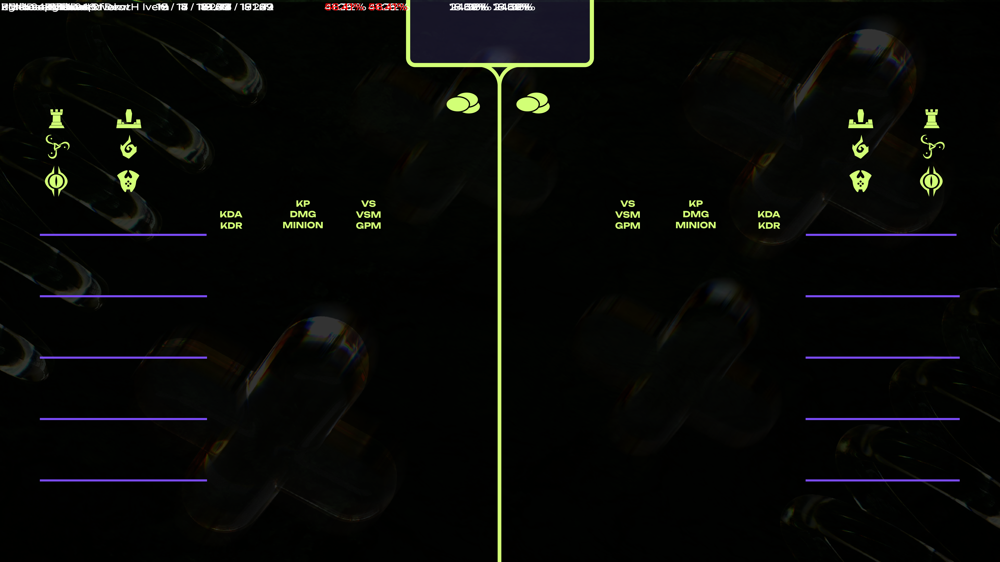

In [ ]:
from PIL import Image, ImageDraw, ImageFont
dfblue = page1[page1['teamId']==100]
dfred = page1[page1['teamId']==100]
df = page1
# Wymiary obrazu
width, height = 722, 200

# Tworzenie obiektu Image
image = Image.new("RGB", (width, height), "white")
folder_path = './'
folder_path_save = './Saved'
file = './LoL_Icons/LolTable.png'#'stretching1.jpg'#
output = "save_1.png"

image = wczytaj(folder_path, file)

# Wybór czcionki i ustalenie jej rozmiaru
font = ImageFont.truetype("./LoL_Icons/Unbounded-Regular.ttf", 72)

# Tworzenie obiektu ImageDraw
draw = ImageDraw.Draw(image)

# Wyznaczanie pozycji Y, aby wyśrodkować tekst
y_position = 10

longestname=0
longestchamp=0
kill_width=0
deaths_width=0
assists_widht=0

idx_longest_word = df['summonerName'].apply(len).idxmax()
longestname, height = draw.textsize(df.loc[idx_longest_word, 'summonerName'],font=font)

idx_longest_word = df['championName'].apply(len).idxmax()
longestchamp, _ = draw.textsize(df.loc[idx_longest_word, 'championName'],font=font)

kill_width = df['kills'].idxmax()
kill_width, _ = draw.textsize(f"{df.loc[kill_width, 'kills']}",font=font)

deaths_width = df['deaths'].idxmax()
deaths_width, _ = draw.textsize(f"{df.loc[deaths_width, 'deaths']}",font=font)

assists_widht = df['assists'].idxmax()
assists_widht, _ = draw.textsize(f"{df.loc[assists_widht, 'assists']}",font=font)

KDA_width = df['KDA'].astype(str).apply(len).idxmax()
KDA_width, _ = draw.textsize(f"{df.loc[KDA_width, 'KDA']}",font=font)

killparp_width = df['UdziałWZabójstwach'].astype(str).apply(len).idxmax()
killparp_width, _ = draw.textsize(f"{df.loc[killparp_width, 'UdziałWZabójstwach']}%",font=font)

blueloop(dfblue,y_position,10)
blueloop(dfred,y_position,359)


# Wyświetlanie obrazu
image

In [ ]:

del draw
del image
del icon

NameError: name 'draw' is not defined

In [ ]:
draw

350,1950      czciona 730 200 od boku zabrać 7 od góry 20 kda 1690 2040

738 75


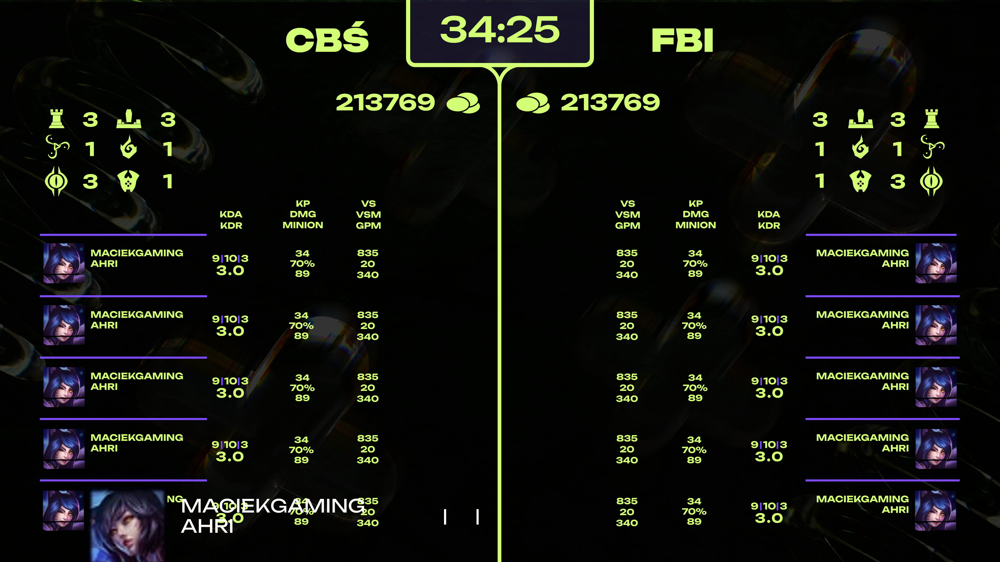

In [ ]:
from PIL import Image, ImageDraw, ImageFont
import numpy as np
# Wymiary obrazu

folder_path = './'

file = './LoL_Icons/LolTableExampleSmall.png'
#file = './LoL_Icons/LolTable.png'#'stretching1.jpg'#
output = "save_1.png"

font = ImageFont.truetype("./LoL_Icons/Unbounded-Regular.ttf", 73)
image = wczytaj(folder_path, file)
text="MACIEKGAMING"
text1='AHRI'
text2='|'
draw = ImageDraw.Draw(image)
assists_widht, height = draw.textsize(text,font=font)
print(assists_widht,height)
# Wybór czcionki i ustalenie jej rozmiaru

# Tworzenie obiektu ImageDraw
draw.text((723, 1979), text, font=font, fill=(255, 255, 255))
draw.text((723, 2060), text1, font=font, fill=(255, 255, 255))
draw.text((1770, 2020), text2, font=font, fill=(255, 255, 255))
draw.text((1900, 2020), text2, font=font, fill=(255, 255, 255))

np.mean([1770,1900])
icon = wczytaj('./LoL_Icons/LoLSmall/','Ahri.png')
size = (320,320)
position = (350,1950)
icon = icon.resize(size)
image.paste(icon, position)

image

In [ ]:
all_champs = pd.read_csv('allchampsid.csv')
all_champs

,id,name,key
0,Aatrox,Aatrox,266
1,Ahri,Ahri,103
2,Akali,Akali,84
3,Akshan,Akshan,166
4,Alistar,Alistar,12
...,...,...,...
162,Zeri,Zeri,221
163,Ziggs,Ziggs,115
164,Zilean,Zilean,26
165,Zoe,Zoe,142


,bans,objectives,teamId,win,gameId
0,"[{'championId': 523, 'pickTurn': 1}, {'champio...","{'baron': {'first': True, 'kills': 1}, 'champi...",100,False,3576274613
1,"[{'championId': 35, 'pickTurn': 6}, {'champion...","{'baron': {'first': False, 'kills': 0}, 'champ...",200,True,3576274613
2,[],"{'baron': {'first': False, 'kills': 0}, 'champ...",100,False,3575365012
3,[],"{'baron': {'first': True, 'kills': 1}, 'champi...",200,True,3575365012
4,[],"{'baron': {'first': False, 'kills': 0}, 'champ...",100,True,3575367697
5,[],"{'baron': {'first': False, 'kills': 0}, 'champ...",200,False,3575367697
6,[],"{'baron': {'first': True, 'kills': 1}, 'champi...",100,True,3575348604
7,[],"{'baron': {'first': False, 'kills': 0}, 'champ...",200,False,3575348604
8,[],"{'baron': {'first': False, 'kills': 0}, 'champ...",100,False,3575277140
9,[],"{'baron': {'first': True, 'kills': 2}, 'champi...",200,True,3575277140


In [113]:
def createstats(obj_mathc,image,draw):
    green = ImageColor.getcolor('#d2ff76', "RGB")
    purple = ImageColor.getcolor('#7b4bf7', "RGB")
    font = ImageFont.truetype("./LoL_Icons/Unbounded-Regular.ttf", 199)
    font2 = ImageFont.truetype("./LoL_Icons/Unbounded-Regular.ttf", 70)
    #1620, 255 730  2000
    timestamp=obj_mathc['time'][0]
    #time = f'{timestamp//60}:'+ "{2f:2f}".format(timestamp%60)
    minutes = timestamp // 60
    seconds = timestamp % 60

    if(obj_mathc.iloc[0]["win"]==True):
        draw.text((40, 10), "WIN", font=font, fill=green)
    else:
        draw.text((40, 10), "LOSE", font=font, fill=green)

    if(obj_mathc.iloc[3]["win"]==True):
        time_width, height = draw.textsize("WIN",font=font)
        draw.text((image.width - 40 - time_width, 10), "WIN", font=font, fill=green)
    else:
        time_width, height = draw.textsize("LOSE",font=font)
        draw.text((image.width - 40 - time_width, 10), "LOSE", font=font, fill=green)
    time = f"{minutes:02d}:{seconds:02d}"
    time_width, height = draw.textsize(time,font=font)
    draw.text((2000 - time_width//2, 130-height//2), time, font=font, fill=green)
    #1 740

    bluegold = str(obj_mathc['teamgold'][1])
    redgold = str(obj_mathc['teamgold'][3])

    rowblue = obj_mathc.iloc[1]
    time_width, height = draw.textsize(bluegold,font=font2)
    draw.text((1740 - time_width, 400-height//2), bluegold, font=font2, fill=green)
    
    time_width, height = draw.textsize(redgold,font=font2)
    draw.text((image.width-(1740), 400-height//2), redgold, font=font2, fill=green)


    btower = str(rowblue['tower'])
    time_width, height = draw.textsize(btower,font=font2)
    draw.text((363 + 315 - time_width//2, 435+38-height//2), btower, font=font2, fill=green)

    bhorde = str(rowblue['horde'])
    time_width, height = draw.textsize(bhorde,font=font2)
    draw.text((363 - time_width//2, 435+38-height//2), bhorde, font=font2, fill=green)

    bherald = str(rowblue['riftHerald'])
    time_width, height = draw.textsize(bherald,font=font2)
    draw.text((363 - time_width//2, 540+48-height//2), bherald, font=font2, fill=green)


    binhibitor = str(rowblue['inhibitor'])
    time_width, height = draw.textsize(binhibitor,font=font2)
    draw.text((363 +315 - time_width//2,540+48-height//2), binhibitor, font=font2, fill=green)

    bdragon = str(rowblue['dragon'])
    time_width, height = draw.textsize(bdragon,font=font2)
    draw.text((363 +315 - time_width//2, 665+61-height//2), bdragon, font=font2, fill=green)

    bbaron = str(rowblue['baron'])
    time_width, height = draw.textsize(bbaron,font=font2)
    draw.text((363 - time_width//2, 665+61-height//2), bbaron, font=font2, fill=green)

    rowblue = obj_mathc.iloc[3]

    btower = str(rowblue['tower'])
    time_width, height = draw.textsize(btower,font=font2)
    draw.text((image.width-(363 +315 + 50)- time_width//2, 435+38-height//2), btower, font=font2, fill=green)
    
    bhorde = str(rowblue['horde'])
    time_width, height = draw.textsize(bhorde,font=font2)
    draw.text((image.width-(363 + 50)- time_width//2, 435+38-height//2), bhorde, font=font2, fill=green)

    bherald = str(rowblue['riftHerald'])
    time_width, height = draw.textsize(bherald,font=font2)
    draw.text((image.width-(363 + 50)- time_width//2, 540+48-height//2), bherald, font=font2, fill=green)


    binhibitor = str(rowblue['inhibitor'])
    time_width, height = draw.textsize(binhibitor,font=font2)
    draw.text((image.width-(363 +315 + 50)- time_width//2, 540+48-height//2), binhibitor, font=font2, fill=green)
    #540+48-height//2, 435+38-height//2
    bdragon = str(rowblue['dragon'])
    time_width, height = draw.textsize(bdragon,font=font2)
    draw.text((image.width-(363 +315 + 50)- time_width//2, 665+61-height//2), bdragon, font=font2, fill=green)

    bbaron = str(rowblue['baron'])
    time_width, height = draw.textsize(bbaron,font=font2)
    draw.text((image.width-(363 + 50) - time_width//2, 665+61-height//2), bbaron, font=font2, fill=green)


    teamname1 = "PAK"
    teamname2 = "ERA"
    time_width, height = draw.textsize(teamname1,font=font)
    draw.text((1300 - time_width//2, 130-height//2), teamname1, font=font, fill=purple)
    time_width, height = draw.textsize(teamname2,font=font)
    draw.text((2700 - time_width//2, 130-height//2), teamname2, font=font, fill=purple)

In [ ]:
obj_mathc

,baron,champion,dragon,horde,inhibitor,riftHerald,tower,teamId,teamgold,time
0,True,False,False,False,True,False,False,100,97277,2094
1,1,39,2,0,2,0,9,100,97277,2094
2,False,True,True,False,False,False,True,200,102991,2094
3,0,60,1,0,6,0,11,200,102991,2094


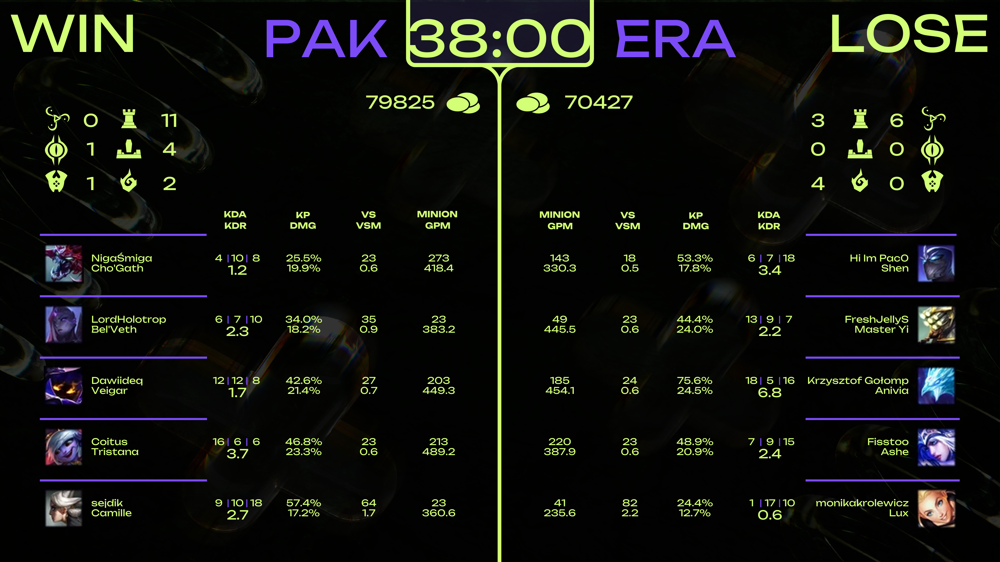

In [114]:
from PIL import Image, ImageDraw, ImageFont, ImageColor
import numpy as np
# Wymiary obrazu


dfblue = page1[page1['teamId']==100].reset_index()
dfred = page1[page1['teamId']==200].reset_index()
all_champs = pd.read_csv('allchampsid.csv')


file = './LoL_Icons/LolTableSmall2.png'
#file = './LoL_Icons/LolTable.png'#'stretching1.jpg'#
image = Image.open(file)
first_rowx=155
first_rowy=945

draw = ImageDraw.Draw(image)
rowheights=[945,1190,1435,1680,1925]
createstats(obj_mathc,image,draw)
#i=0
for i, row in dfblue.iterrows():
    bluesideitem(row,image,draw,rowheights[i],all_champs)
for i, row in dfred.iterrows():
    redsideitem(row,image,draw,rowheights[i],all_champs)

image

In [ ]:
page1.columns

Index(['summonerName', 'championName', 'kills', 'deaths', 'assists',
       'UdziałWZabójstwach', 'goldEarned', 'win', 'teamId',
       'neutralMinionsKilled', 'largestKillingSpree', 'largestMultiKill',
       'totalMinionsKilled', 'UdziałWZabójstwach1', 'UdziałWGold', 'MaxKills',
       'MinDeaths', 'MaxAssist', 'KDA', 'MaxKDA', 'MaxKillparp', 'MaxGold'],
      dtype='object')

In [83]:
def bluesideitem(row,image,draw,rowheigth,all_champs):
    green = ImageColor.getcolor('#d2ff76', "RGB")
    purple = ImageColor.getcolor('#7b4bf7', "RGB")
    font = ImageFont.truetype("./LoL_Icons/Unbounded-Regular.ttf", 37)
    font2 = ImageFont.truetype("./LoL_Icons/Unbounded-Regular.ttf", 50)
    summonerName=row['summonerName']
    championName=all_champs[all_champs['id']==row['championName']]['name'].values[0]
    semi='|'
    kills =str(row['kills'])
    deaths =str(row['deaths'])
    assists =str(row['assists'])
    kda = "{:.1f}".format(row['KDA'])
    kp="{:.1f}%".format(row['UdziałWZabójstwach'])
    dmg="{:.1f}%".format(row['UdziałWGold'])
    minions = str(row['totalMinionsKilled'])
    vs=str(row['visionScore'])
    vsm="{:.1f}".format(row['vpm'])
    gpm="{:.1f}".format(row['gpm'])
    rowy=rowheigth
    rowx=155

    draw.text((rowx+210, rowy+65), summonerName, font=font, fill=green)
    draw.text((rowx+210, rowy+105), championName, font=font, fill=green)
    draw.text((rowx+730 + 22, rowy+65), semi, font=font, fill=purple)
    draw.text((rowx+795 + 32, rowy+65), semi, font=font, fill=purple)

    deathwithmean = 895+50# np.mean([rowx+730,rowx+795])
    deathwith, height = draw.textsize(deaths,font=font)
    killhwithmean = np.mean([rowx+665,rowx+730])
    killwith, height = draw.textsize(kills,font=font)

    assisthwithmean = np.mean([rowx+795,rowx+860])
    assistswith, height = draw.textsize(assists,font=font)

    draw.text((killhwithmean + 17 - killwith//2 +5, rowy+65), kills, font=font, fill=green)
    draw.text((deathwithmean - deathwith//2 +5, rowy+65), deaths, font=font, fill=green)
    draw.text((assisthwithmean + 32 - assistswith//2 +10, rowy+65), assists, font=font, fill=green)
    KDA_width, height = draw.textsize(kda,font=font2)
    draw.text((deathwithmean - KDA_width//2 +5, rowy+105), kda, font=font2, fill=green)
    icon = Image.open(f'./LoL_Icons/LoLSmall/{row["championName"]}.png')
    size = (160,160)
    position = (rowx+20,rowy+30)
    icon = icon.resize(size)
    image.paste(icon, position)
    kp_width, height = draw.textsize(kp,font=font)
    draw.text((1210 - kp_width//2 +5, rowy+65), kp, font=font, fill=green)

    dmg_width, height = draw.textsize(dmg,font=font)
    draw.text((1210 - dmg_width//2 +5, rowy+105), dmg, font=font, fill=green)



    vs_width, height = draw.textsize(vs,font=font)
    draw.text((1470 - vs_width//2 +5, rowy+65), vs, font=font, fill=green)

    vsm_width, height = draw.textsize(vsm,font=font)
    draw.text((1470 - vsm_width//2 +5, rowy+105), vsm, font=font, fill=green)

    gpm_width, height = draw.textsize(gpm,font=font)
    draw.text((1750 - gpm_width//2 +5, rowy+105), gpm, font=font, fill=green)

    minions_width, height = draw.textsize(minions,font=font)
    draw.text((1750 - minions_width//2 +5, rowy+65), minions, font=font, fill=green)

In [82]:
def redsideitem(row,image,draw,rowheigth,all_champs):
    width = image.width
    green = ImageColor.getcolor('#d2ff76', "RGB")
    purple = ImageColor.getcolor('#7b4bf7', "RGB")
    font = ImageFont.truetype("./LoL_Icons/Unbounded-Regular.ttf", 37)
    font2 = ImageFont.truetype("./LoL_Icons/Unbounded-Regular.ttf", 50)
    summonerName=row['summonerName']
    championName=all_champs[all_champs['id']==row['championName']]['name'].values[0]
    semi='|'
    kills =str(row['kills'])
    deaths =str(row['deaths'])
    assists = str(row['assists'])
    kda = "{:.1f}".format(row['KDA'])
    kp="{:.1f}%".format(row['UdziałWZabójstwach'])
    dmg="{:.1f}%".format(row['UdziałWGold'])
    minions = str(row['totalMinionsKilled'])
    vs=str(row['visionScore'])
    vsm="{:.1f}".format(row['vpm'])
    gpm="{:.1f}".format(row['gpm'])
    rowy=rowheigth
    rowx=155
    
    summonernamewidth, _ = draw.textsize(summonerName,font=font)
    draw.text((width-(rowx+210+summonernamewidth), rowy+65), summonerName, font=font, fill=green)
    tempwidth,_ = draw.textsize(championName,font=font)
    draw.text((width-(rowx+210+tempwidth), rowy+105), championName, font=font, fill=green)

    draw.text((width-(rowx+730 + 2), rowy+65), semi, font=font, fill=purple)
    draw.text((width-(rowx+795 + 12), rowy+65), semi, font=font, fill=purple)

    deathwithmean = 925#np.mean([rowx+730,rowx+795])
    deathwith, height = draw.textsize(deaths,font=font)

    assisthwithmean = np.mean([rowx+665,rowx+730])
    killwith, height = draw.textsize(kills,font=font)

    killhwithmean = np.mean([rowx+795,rowx+860])
    assistswith, height = draw.textsize(assists,font=font)

    draw.text((width-(killhwithmean + 12)-killwith//2, rowy+65), kills, font=font, fill=green)
    draw.text((width-(deathwithmean)+5- deathwith//2, rowy+65), deaths, font=font, fill=green)
    draw.text((width-(assisthwithmean - 3 )+5-assistswith//2, rowy+65), assists, font=font, fill=green)
    KDA_width, height = draw.textsize(kda,font=font2)
    draw.text((width-(deathwithmean - KDA_width//2+KDA_width-5), rowy+105), kda, font=font2, fill=green)
    icon = Image.open(f'./LoL_Icons/LoLSmall/{row["championName"]}.png')
    size = (160,160)
    position = (width-(rowx+20+160),rowy+30)
    icon = icon.resize(size)
    image.paste(icon, position)
    kp_width, height = draw.textsize(kp,font=font)
    draw.text((width-(1210 - kp_width//2+kp_width +10), rowy+65), kp, font=font, fill=green)

    dmg_width, height = draw.textsize(dmg,font=font)
    draw.text((width-(1210 - dmg_width//2 +dmg_width+10), rowy+105), dmg, font=font, fill=green)

    vs_width, height = draw.textsize(vs,font=font)
    draw.text((width-(1470 - vs_width//2 +vs_width+10), rowy+65), vs, font=font, fill=green)

    vsm_width, height = draw.textsize(vsm,font=font)
    draw.text((width-(1470 - vsm_width//2 +vsm_width+10), rowy+105), vsm, font=font, fill=green)
    
    minions_width, height = draw.textsize(minions,font=font)
    draw.text((width-(1750 - minions_width//2 +minions_width+10), rowy+65), minions, font=font, fill=green)
    
    gpm_width, height = draw.textsize(gpm,font=font)
    draw.text((width-(1750 - gpm_width//2 +gpm_width+10), rowy+105), gpm, font=font, fill=green)


In [28]:
image_path = "./LoL_Icons/LolTable2.png"

# Wczytaj obraz
image = Image.open(image_path)

# Pobierz aktualne wymiary obrazu
width, height = image.size

# Zmniejsz obraz o połowę
new_width = width // 2
new_height = height // 2
smaller_image = image.resize((new_width, new_height))

# Wyświetl lub zapisz zmniejszony obraz
smaller_image.save("./LoL_Icons/LolTableSmall2.png")

In [ ]:
np.mean([1770,1900])

1835.0

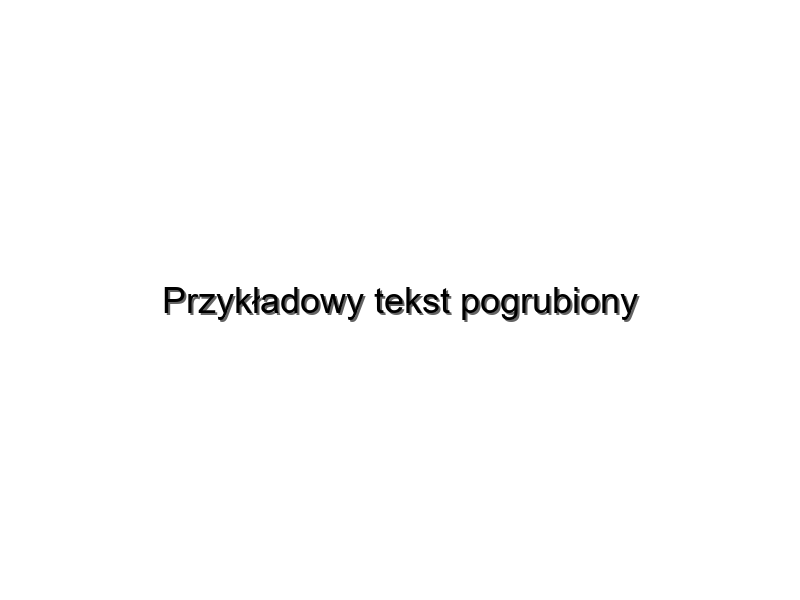

In [ ]:
from PIL import Image, ImageDraw, ImageFont

# Ścieżka do obrazu wyjściowego
output_image_path = "output_image.jpg"

# Rozmiar obrazu
image_width = 800
image_height = 600

# Tekst do umieszczenia na obrazie
text = "Przykładowy tekst pogrubiony"

# Ścieżka do pliku czcionki
font_path = "arial.ttf"

# Rozmiar czcionki
font_size = 36

# Kolor tekstu
text_color = (0, 0, 0)

# Kolor cienia
shadow_color = (100, 100, 100)  # Kolor cienia może być dostosowany według potrzeb

# Utwórz nowy obrazek
image = Image.new("RGB", (image_width, image_height), color="white")
draw = ImageDraw.Draw(image)

# Załaduj czcionkę
font = ImageFont.truetype(font_path, font_size)

# Wymiary tekstu
text_width, text_height = draw.textsize(text, font=font)

# Pozycja tekstu (środek obrazu)
text_x = (image_width - text_width) / 2
text_y = (image_height - text_height) / 2

# Wstawienie cienia
shadow_offset = 2
draw.text((text_x + shadow_offset, text_y + shadow_offset), text, fill=shadow_color, font=font)

# Wstawienie tekstu
draw.text((text_x, text_y), text, fill=text_color, font=font)

# Zapisz obrazek
image


In [ ]:
def custom_textsize(text, font):
    # Uzyskaj rozmiar pojedynczego znaku
    char_width, char_height = font.getsize("A")

    # Znajdź najdłuższy wiersz
    max_width = 0
    for line in text.split('\n'):
        width = len(line) * char_width
        if width > max_width:
            max_width = width

    # Znajdź liczbę wierszy
    num_lines = text.count('\n') + 1

    # Oblicz szerokość i wysokość tekstu
    total_width = max_width
    total_height = num_lines * char_height

    return total_width, total_height

In [ ]:
def blueloop(df,y_position,start_x):
    for i,row in df.iterrows():
        poz_x = start_x
        if y_position>=59:
            y_position = 10
        width, _ = draw.textsize(row['summonerName'], font=font)
        #poz_x=10
        draw.text((poz_x, y_position), row['summonerName'], font=font, fill=(255, 255, 255))

        poz_x+=5+longestname
        draw.text((poz_x, y_position), row['championName'], font=font, fill=(255, 255, 255))
        kills = f"{row['kills']}"
        deaths = f"{row['deaths']}"
        assists = f"{row['assists']}"
        kda = "{:.2f}".format(row['KDA'])
        killparp = "{:.2f}".format(row['UdziałWZabójstwach'])
        goldparp = "{:.2f}".format(row['UdziałWGold'])
        slash = ' / '
        slash_width = draw.textsize(slash, font=font)[0]
        poz_x+=5+longestchamp
        color = (255, 0, 0) if row['MaxKills'] else (255, 255, 255)
        kill_width_in = draw.textsize(kills, font=font)[0]
        draw.text((poz_x+(kill_width-kill_width_in), y_position), kills, font=font, fill=color)  # Czerwony kolor dla kills
        
        poz_x+=kill_width
        draw.text((poz_x, y_position), slash, font=font, fill=(255, 255, 255))


        poz_x+=slash_width

        deaths_width_in = draw.textsize(deaths, font=font)[0]
        color = (255, 0, 0) if row['MinDeaths'] else (255, 255, 255)
        draw.text((poz_x+(deaths_width-deaths_width_in), y_position), deaths, font=font, fill=color)

        poz_x+=deaths_width
        draw.text((poz_x, y_position), slash, font=font, fill=(255, 255, 255))


        poz_x+=slash_width

        assists_width_in = draw.textsize(assists, font=font)[0]
        color = (255, 0, 0) if row['MaxAssist'] else (255, 255, 255)
        draw.text((poz_x+(assists_widht-assists_width_in), y_position), assists, font=font, fill=color)

        poz_x +=assists_widht + 5

        color = (255, 0, 0) if row['MaxKDA'] else (255, 255, 255)
        draw.text((poz_x, y_position), kda, font=font, fill=color)

        poz_x += KDA_width + 5

        color = (255, 0, 0) if row['MaxKillparp'] else (255, 255, 255)
        draw.text((poz_x, y_position), f"{killparp}%", font=font, fill=color)

        poz_x += killparp_width + 5
        
        color = (255, 0, 0) if row['MaxGold'] else (255, 255, 255)
        draw.text((poz_x, y_position), f"{goldparp}%", font=font, fill=color)

        print(poz_x+killparp_width + 5)
        y_position += font.getsize(row['summonerName'])[1]

In [ ]:
page1['UdziałWZabójstwach'] = page1['UdziałWZabójstwach'].round(2)
page1['UdziałWGold'] = page1['UdziałWGold'].round(2)
page1['KDA'] = page1['KDA'].round(2)


In [ ]:
pd.set_option('display.max_columns', None)
page1

In [ ]:
path = './LoL_Icons/LoLSmall'

In [ ]:
for i,row in all_champs.iterrows():
    id = row['id']
    wczytaj(path,id+".png")
    

In [97]:
def init_df(df_group,grupy):
    for grpups in grupy:
        for team in grpups:
            df_group=df_group.append({"team":team,'wins':0,'losses':0,'place':0},ignore_index=True)
    return df_group


In [98]:
def addpoints(groups_df,team,win):
    if win==True:
        groups_df.loc[groups_df['team'] == team, 'wins']+=1
    else:
        groups_df.loc[groups_df['team'] == team, 'losses']+=1

In [99]:
import warnings
warnings.simplefilter("ignore", category=FutureWarning)

In [205]:
import os
import pandas as pd
def create_groups():
    grupaA = ['PIW','H&M','SYN','TMK']
    grupaB = ['ATS',"SER",'NSP','GIT']
    grupaC = ['KBI','KZL','TB','GWB']
    grupaD = ['444','BE','NNW','STW']
    grupy = [grupaA,grupaB,grupaC,grupaD]
    # Ścieżka do folderu z plikami CSV
    folder_path = ".\LoL_Icons\wins"
    df_wins = pd.DataFrame()
    columns=['team','wins','losses','place']
    df_groups = pd.DataFrame(columns=columns)  
    df_groups=init_df(df_groups,grupy)
    
    file_list = os.listdir(folder_path)
    print(file_list)
    # Iteracja po plikach
    for file_name in file_list:
        # Sprawdzenie, czy plik ma rozszerzenie CSV
        if file_name.endswith(".csv"):
            # Pełna ścieżka do pliku
            file_path = os.path.join(folder_path, file_name)
            
            # Wczytanie pliku CSV do ramki danych
            df = pd.read_csv(file_path)
            teama = df.iloc[0][['team','win']]
            teamb = df.iloc[3][['team','win']]
            row={'Drużyna1': teama['team'], 'Wygrane1': teama['win'], 'Drużyna2': teamb['team'], 'Wygrane2': teamb['win']}
            addpoints(df_groups,teama["team"],teama['win'])
            addpoints(df_groups,teamb["team"],teamb['win'])
            df_wins = df_wins.append(row,ignore_index=True)

    grupaAdf = df_groups[df_groups['team'].isin(grupaA)].sort_values('losses').sort_values('wins', ascending=False)
    grupaBdf = df_groups[df_groups['team'].isin(grupaB)].sort_values('losses').sort_values('wins', ascending=False)

    grupaCdf = df_groups[df_groups['team'].isin(grupaC)].sort_values('losses').sort_values('wins', ascending=False)
    grupaDdf = df_groups[df_groups['team'].isin(grupaD)].sort_values('losses').sort_values('wins', ascending=False)
    chechdraw(grupaAdf,df_wins)
    chechdraw(grupaBdf,df_wins)
    chechdraw(grupaCdf,df_wins)
    chechdraw(grupaDdf,df_wins)
    dfs = [grupaAdf.sort_values('place').sort_values('wins', ascending=False), 
       grupaBdf.sort_values('place').sort_values('wins', ascending=False), 
       grupaCdf.sort_values('place').sort_values('wins', ascending=False), 
       grupaDdf.sort_values('place').sort_values('wins', ascending=False)]


In [201]:
grupaAdf

,team,wins,losses,place
1,H&M,2,1,1
3,TMK,2,1,0
0,PIW,1,2,3
2,SYN,1,2,0


250
750
1250
1750


D:\Temp\ipykernel_19472\2705354407.py:27: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  text_width, text_height = draw.textsize(text, font=font)
D:\Temp\ipykernel_19472\2705354407.py:33: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  text_width, text_height = draw.textsize(textin, font=font)
D:\Temp\ipykernel_19472\2705354407.py:33: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  text_width, text_height = draw.textsize(textin, font=font)
D:\Temp\ipykernel_19472\2705354407.py:33: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  text_width, text_height = draw.textsize(textin, font=font)
D:\Temp\ipykernel_19472\2705354407.py:33: DeprecationWarning: textsize is deprecated a

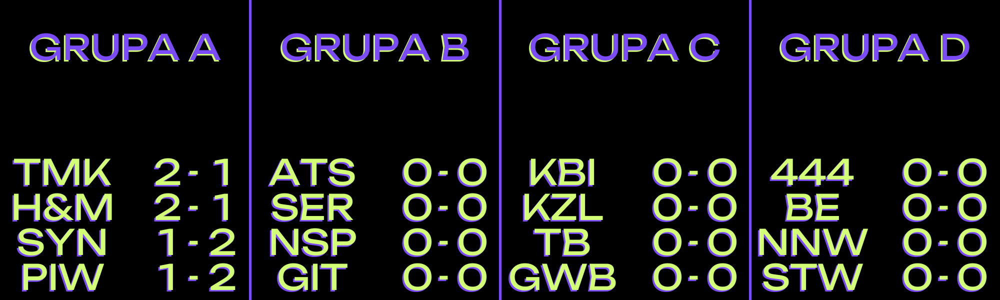

In [206]:
from PIL import Image, ImageDraw, ImageFont, ImageColor
from PIL import Image
def load_groups():
    # Określenie wymiarów obrazu
    width = 2000
    height = 600

    # Utworzenie przezroczystego obrazu
    transparent_image = Image.new("RGBA", (width, height), (0, 0, 0, 255))
    transparent_image
    draw = ImageDraw.Draw(transparent_image)
    green = ImageColor.getcolor('#d2ff76', "RGB")
    purple = ImageColor.getcolor('#7b4bf7', "RGB")
    # Współrzędne początku i końca linii
    x_coords = [width // 4, width // 2, width * 3 // 4]

    # Rysowanie pionowych linii
    for x in x_coords:
        draw.line([(x, 0), (x, height)], fill=purple, width=5)
    area_width = width // 4
    areas = [(i * area_width, 0, (i + 1) * area_width, height) for i in range(4)]
    text = "GRUPA"

    font = ImageFont.truetype("./LoL_Icons/Unbounded-Regular.ttf", 70)

    # Wymiary tekstu
    text_width, text_height = draw.textsize(text, font=font)
    letters = ['A','B','C','D']
    # Rysowanie tekstu w środku każdej części
    i=0
    for area in areas:
        textin =  text +f" {letters[i]}"
        text_width, text_height = draw.textsize(textin, font=font)
        area_center_x = (area[0] + area[2]) // 2
        area_center_y = (area[1] + area[3]) // 2
        text_position = (area_center_x - text_width // 2, 50)
        draw.text((text_position[0]-3,text_position[1]+3), textin , fill=green, font=font)
        draw.text(text_position, textin , fill=purple, font=font)
        i+=1
    for i, area in enumerate(areas):
        area_center_x = (area[0] + area[2]) // 2
        area_center_y = (area[1] + area[3]) // 2
        
        # Wybieranie wybranych kolumn
        selected_df = dfs[i][['team','wins','losses']]
        print(area_center_x)
        
        # Konwersja ramki danych do formatu tekstowego
        i=0
        for x,row in selected_df.iterrows():
            name,wins,losses = row[['team','wins','losses']]
            text_width, text_height = draw.textsize(name, font=font)
            text_position = (area_center_x-125 - text_width//2, 300 + i*70)
            draw.text((text_position[0]-3,text_position[1]+3), name , fill=purple, font=font)
            draw.text(text_position, name , fill=green, font=font)
            winloss_x= area_center_x+125
            text_position = (winloss_x, 300 + i*70)
            draw.text((text_position[0]-3,text_position[1]+3), "-", fill=purple, font=font)
            draw.text(text_position, "-", fill=green, font=font)
            wins = str(wins)
            text_width, text_height = draw.textsize(wins, font=font)
            text_position = (winloss_x-40 - text_width//2, 300 + i*70)
            draw.text((text_position[0]-3,text_position[1]+3), wins, fill=purple, font=font)
            draw.text(text_position, wins, fill=green, font=font)
            wins = str(losses)
            text_width, text_height = draw.textsize(wins, font=font)
            text_position = (winloss_x+70- text_width//2, 300 + i*70)
            draw.text((text_position[0]-3,text_position[1]+3), wins, fill=purple, font=font)
            draw.text(text_position, wins, fill=green, font=font)
            i+=1
        df_text = selected_df.to_string(index=False)
        
        # Wypisanie zawartości ramki danych
        #draw.text((area_center_x, area_center_y), df_text, fill="white", font=font, anchor="mm")


    transparent_image

In [204]:
df_wins

,Drużyna1,Wygrane1,Drużyna2,Wygrane2
0,cyk,False,pyk,True
1,H&M,False,TMK,True
2,KOKS,False,MARC,True
3,one,False,two,True
4,PIW,False,H&M,True
5,PIW,False,SYN,True
6,red,True,blue,False
7,SYN,False,H&M,True
8,SYN,False,TMK,True
9,test,True,test,False


In [118]:
grupaAdf

,team,wins,losses,place
1,H&M,2,1,1
3,TMK,2,1,0
0,PIW,1,2,3
2,SYN,1,2,0


In [8]:
df_wins

,Drużyna1,Wygrane1,Drużyna2,Wygrane2
0,cyk,False,pyk,True
1,KOKS,False,MARC,True
2,one,False,two,True
3,red,True,blue,False
4,test,True,test,False


In [71]:
import pandas as pd
print(pd.__version__)

1.5.3


In [4]:
import sys

print(sys.executable)

e:\matematyka\obliczenia\.venv\Scripts\python.exe


In [119]:
grupaAdf.sort_values('place').sort_values('wins', ascending=False)

,team,wins,losses,place
3,TMK,2,1,0
1,H&M,2,1,1
2,SYN,1,2,0
0,PIW,1,2,3


In [104]:
def chechdraw(grupa,df_win):
    for i in range(0,len(grupa)-1):
        row1=grupa.iloc[i]
        row2=grupa.iloc[i+1]
        if (row1['wins'] == row2['wins']) & (row1['losses'] == row2['losses']):
            wartosc_1 = str(row1['team'])
            wartosc_2 = str(row2['team'])
            print(wartosc_1,wartosc_2)
            wynik = df_win[((df_win['Drużyna1'] == wartosc_1) & (df_win['Drużyna2'] == wartosc_2)) |  ((df_win['Drużyna2'] == wartosc_1) & (df_win['Drużyna1'] == wartosc_2))]
            print(wynik)
            if wynik.empty:
                row1['place']=i
                row2['place']=i+1
                continue
            wynik = wynik.iloc[0]
            print(wynik)
            if row1['team'] == wynik['Drużyna1']:
                if wynik['Wygrane1']=='True':
                    row1['place']=row1['place']
                    row2['place']=i+1
                else:
                    row1['place']=i+1
                    row2['place']=row2['place']
            else:
                if wynik['Wygrane1']=='True':
                    row1['place']=i+1
                    row2['place']=row2['place']
                else:
                    row1['place']=row1['place']
                    row2['place']=i+1
        else:
            row1['place']=row1['place']
            row2['place']=row1['place']+1

        grupa.iloc[i]=row1
        grupa.iloc[i+1]=row2

In [103]:
df = df_wins

In [77]:
df

,Drużyna1,Wygrane1,Drużyna2,Wygrane2
0,cyk,False,pyk,True
1,H&M,False,TMK,True
2,KOKS,False,MARC,True
3,one,False,two,True
4,PIW,False,H&M,True
5,PIW,False,SYN,True
6,red,True,blue,False
7,SYN,False,H&M,True
8,SYN,False,TMK,True
9,test,True,test,False


In [80]:
wartosc_1 = 'SYN'
wartosc_2 = 'H&M'
wynik = df[((df['Drużyna1'] == wartosc_1) & (df['Drużyna2'] == wartosc_2)) |  ((df['Drużyna2'] == wartosc_1) & (df['Drużyna1'] == wartosc_2))]
print(wynik)

  Drużyna1  Wygrane1 Drużyna2  Wygrane2
7      SYN     False      H&M      True


In [33]:
grupaBdf.sort_values('wins', ascending=False).sort_values('losses')

,team,wins,losses
5,MARC,1,0
7,red,1,0
6,test,1,1
4,KOKS,0,1
8,blue,0,1


In [35]:
identical_results = grupaBdf[grupaBdf.duplicated(subset=['wins', 'losses'], keep=False)]

In [36]:
identical_results

,team,wins,losses
4,KOKS,0,1
5,MARC,1,0
7,red,1,0
8,blue,0,1


In [27]:
df_wins

,Drużyna1,Wygrane1,Drużyna2,Wygrane2
0,cyk,False,pyk,True
1,one,False,two,True
2,red,True,blue,False


In [30]:
df_groups

,0
0,team
1,losses
2,wins


In [37]:
groups = grupaBdf.groupby(['wins', 'losses'])

# Tworzenie osobnych DataFrame'ów dla każdej grupy
dfs = []
for name, group in groups:
    dfs.append(group.copy())

# Wyświetlanie osobnych DataFrame'ów dla każdej grupy
for idx, df_group in enumerate(dfs):
    print(f"Dla wyników {groups.groups.keys()[idx]}:")
    print(df_group)
    print("\n")

TypeError: 'dict_keys' object is not subscriptable

In [ ]:
wynik = df[(df['Kolumna1'] == wartosc_1) | (df['Kolumna1'] == wartosc_2) |
           (df['Kolumna2'] == wartosc_1) | (df['Kolumna2'] == wartosc_2)]